In [1]:
import os
import glob
import zipfile
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker


In [2]:
zip_file_name = "Trade_database_download_v2025.1.zip"
data_directory = "cites_trade_data"

if not os.path.exists(data_directory):
    os.makedirs(data_directory)
    print(f"Created directory: '{data_directory}'")

if not os.listdir(data_directory):
    try:
        with zipfile.ZipFile(zip_file_name, 'r') as zip_ref:
            zip_ref.extractall(data_directory)
        print(f"Successfully unzipped '{zip_file_name}' into '{data_directory}'")
    except FileNotFoundError:
        print(f"ERROR: The file '{zip_file_name}' was not found.")
else:
    print(f"Directory '{data_directory}' already contains files.")

Directory 'cites_trade_data' already contains files.


In [3]:
csv_files = glob.glob(os.path.join(data_directory, 'trade_db_*.csv'))

if not csv_files:
    csv_files = glob.glob(os.path.join(data_directory, '*.csv'))

if not csv_files:
    print(f"ERROR: No CSV files found in the '{data_directory}' directory.")
else:
    print(f"Found {len(csv_files)} CSV files. Loading and concatenating...")
    df_list = (pd.read_csv(file, low_memory=False, encoding='latin1') for file in csv_files)
    wild_df_raw = pd.concat(df_list, ignore_index=True)
    print("Successfully loaded and concatenated all CSV files.")
    print("Initial shape of the dataframe:", wild_df_raw.shape)
    print("Initial columns:", wild_df_raw.columns.tolist())

Found 56 CSV files. Loading and concatenating...
Successfully loaded and concatenated all CSV files.
Initial shape of the dataframe: (27901870, 20)
Initial columns: ['Id', 'Year', 'Appendix', 'Taxon', 'Class', 'Order', 'Family', 'Genus', 'Term', 'Quantity', 'Unit', 'Importer', 'Exporter', 'Origin', 'Purpose', 'Source', 'Reporter.type', 'Import.permit.RandomID', 'Export.permit.RandomID', 'Origin.permit.RandomID']


In [4]:
# Drop unnecessary columns that are irrelevant for this analysis
columns_to_drop = ['Id', 'Reporter.type', 'Import.permit.RandomID', 'Export.permit.RandomID', 'Origin.permit.RandomID']
wild_df_cleaned = wild_df_raw.drop(columns=columns_to_drop, errors='ignore')

# Filter for fauna (animal) records only by checking if 'Class' is populated and removing 'Plantae'
wild_df_fauna = wild_df_cleaned[wild_df_cleaned['Class'].notna()].copy()
wild_df_fauna = wild_df_fauna[wild_df_fauna['Taxon'] != 'Plantae']

# Sort the records for chronological and taxonomic order
wild_df_sorted = wild_df_fauna.sort_values(by=['Year', 'Taxon', 'Class']).reset_index(drop=True)

In [5]:
print("Handling missing values")
fill_values = {
    'Class': 'unknown', 'Order': 'unknown', 'Family': 'unknown', 'Genus': 'unknown',
    'Unit': 'units', 'Importer': 'XX', 'Exporter': 'XX', 'Origin': 'XX',
    'Purpose': 'unknown', 'Source': 'unknown', 'Quantity': 0
}
wild_df_sorted.fillna(fill_values, inplace=True)

# Assign the cleaned dataframe to its final variable name for analysis
df_trade = wild_df_sorted

print("Data cleaning and preprocessing complete.")
print("Shape of the final dataframe:", df_trade.shape)
print("\nNull values count after cleaning:")
print(df_trade.isnull().sum())

Handling missing values
Data cleaning and preprocessing complete.
Shape of the final dataframe: (20141656, 15)

Null values count after cleaning:
Year        0
Appendix    0
Taxon       0
Class       0
Order       0
Family      0
Genus       0
Term        0
Quantity    0
Unit        0
Importer    0
Exporter    0
Origin      0
Purpose     0
Source      0
dtype: int64


In [6]:
df_trade.head()

,Year,Appendix,Taxon,Class,Order,Family,Genus,Term,Quantity,Unit,Importer,Exporter,Origin,Purpose,Source
0,1975,II,Ailurus fulgens,Mammalia,Carnivora,Ailuridae,Ailurus,live,2.0,units,CH,DE,XX,Z,unknown
1,1975,II,Aldabrachelys gigantea,Reptilia,Testudines,Testudinidae,Aldabrachelys,bodies,1.0,units,CH,SC,XX,unknown,unknown
2,1975,I,Alligator mississippiensis,Reptilia,Crocodylia,Alligatoridae,Alligator,skins,16.0,units,CH,DE,XX,unknown,unknown
3,1975,I,Anodorhynchus leari,Aves,Psittaciformes,Psittacidae,Anodorhynchus,live,2.0,units,CH,PT,XX,Z,unknown
4,1975,III,Balaenidae spp.,Mammalia,Cetacea,Balaenidae,unknown,bone carvings,7.0,units,CA,DE,CA,unknown,unknown


### **Trading Volume Over Years**
A line chart to show the trend of total wildlife trade quantity over the years.


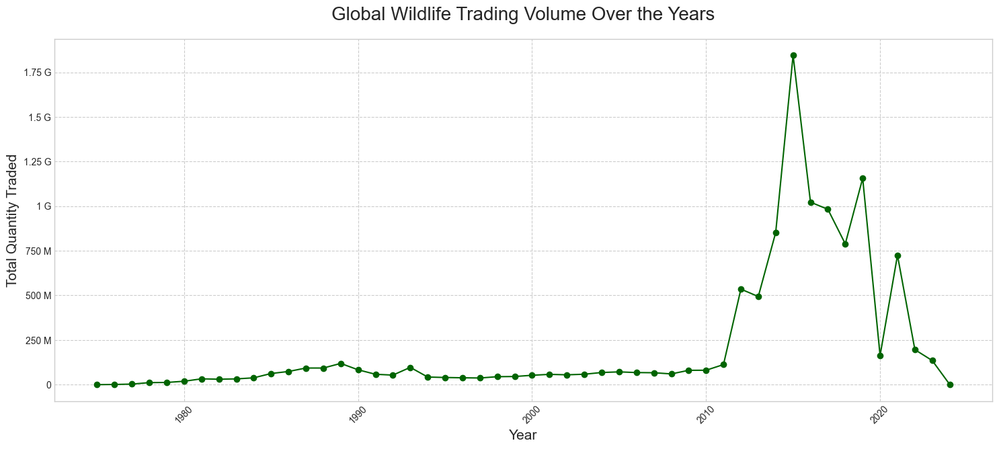

In [7]:
plt.style.use('seaborn-v0_8-whitegrid')

# Group by year and sum the quantity
yearly_volume = df_trade.groupby('Year')['Quantity'].sum()

fig, ax = plt.subplots(figsize=(18, 7))
ax.plot(yearly_volume.index, yearly_volume.values, color='darkgreen', marker='o', linestyle='-')

# Formatting the plot
ax.yaxis.set_major_formatter(mticker.EngFormatter())
ax.set_title('Global Wildlife Trading Volume Over the Years', fontsize=20, pad=20)
ax.set_ylabel('Total Quantity Traded', fontsize=15)
ax.set_xlabel('Year', fontsize=15)
plt.xticks(rotation=45)
plt.grid(True, which="both", ls="--")
plt.show()

### **Top 15 Importing & Exporting Countries**
Horizontal bar charts to compare the top importing and exporting nations by trade volume.

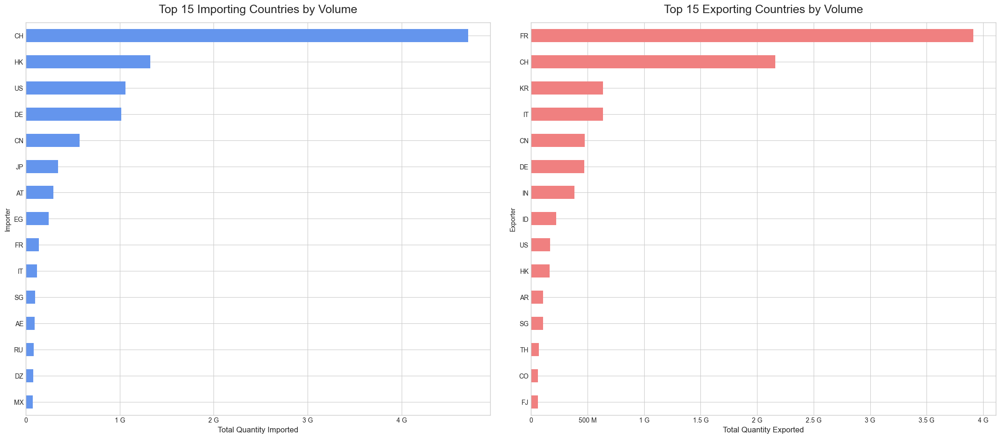

In [8]:
top_importers = df_trade.groupby('Importer')['Quantity'].sum().nlargest(15)
top_exporters = df_trade.groupby('Exporter')['Quantity'].sum().nlargest(15)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 10))

# Importers plot
top_importers.sort_values().plot(kind='barh', ax=ax1, color='cornflowerblue')
ax1.set_title('Top 15 Importing Countries by Volume', fontsize=18, pad=15)
ax1.xaxis.set_major_formatter(mticker.EngFormatter())
ax1.set_xlabel('Total Quantity Imported', fontsize=12)

# Exporters plot
top_exporters.sort_values().plot(kind='barh', ax=ax2, color='lightcoral')
ax2.set_title('Top 15 Exporting Countries by Volume', fontsize=18, pad=15)
ax2.xaxis.set_major_formatter(mticker.EngFormatter())
ax2.set_xlabel('Total Quantity Exported', fontsize=12)

plt.tight_layout(pad=3.0)
plt.show()

### **Top Species and Classes Traded**
Two bar charts to show which specific animal taxa (species/genus) and broader animal classes are most frequently traded.

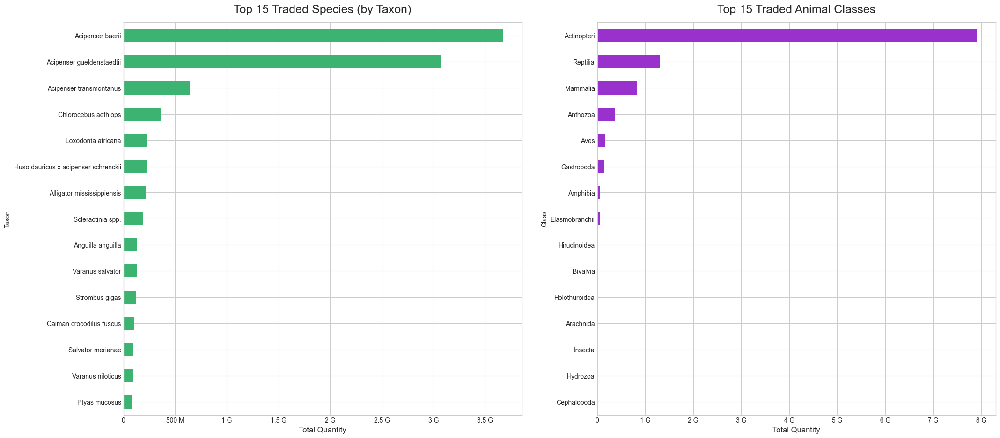

In [9]:
top_species = df_trade.groupby('Taxon')['Quantity'].sum().nlargest(15)
top_classes = df_trade.groupby('Class')['Quantity'].sum().nlargest(15)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 10))

# Species plot
top_species.sort_values().plot(kind='barh', ax=ax1, color='mediumseagreen')
ax1.set_title('Top 15 Traded Species (by Taxon)', fontsize=18, pad=15)
ax1.xaxis.set_major_formatter(mticker.EngFormatter())
ax1.set_xlabel('Total Quantity', fontsize=12)

# Classes plot
top_classes.sort_values().plot(kind='barh', ax=ax2, color='darkorchid')
ax2.set_title('Top 15 Traded Animal Classes', fontsize=18, pad=15)
ax2.xaxis.set_major_formatter(mticker.EngFormatter())
ax2.set_xlabel('Total Quantity', fontsize=12)

plt.tight_layout(pad=3.0)
plt.show()

### **Purpose of Trade (Donut Chart)**
Pie chart (styled as a donut chart) to show the main reasons for wildlife trade (e.g., commercial, scientific, hunting trophies).

In [13]:
import plotly.express as px
import plotly.io as pio

pio.renderers.default = "notebook"

purpose_share = df_trade.groupby('Purpose')['Quantity'].sum().nlargest(10)

fig_pie = px.pie(
    purpose_share.reset_index(),
    values='Quantity',
    names='Purpose',
    title='Share of Top 10 Trade Purposes by Volume',
    hole=0.4  # This creates the donut chart effect
)
fig_pie.update_traces(textposition='inside', textinfo='percent+label', pull=[0.05] * len(purpose_share))
fig_pie.show()

### **Forms of Trade (Treemap)**
A treemap to visualize the most common forms in which wildlife is traded (e.g., live, skins, bodies, specimens).

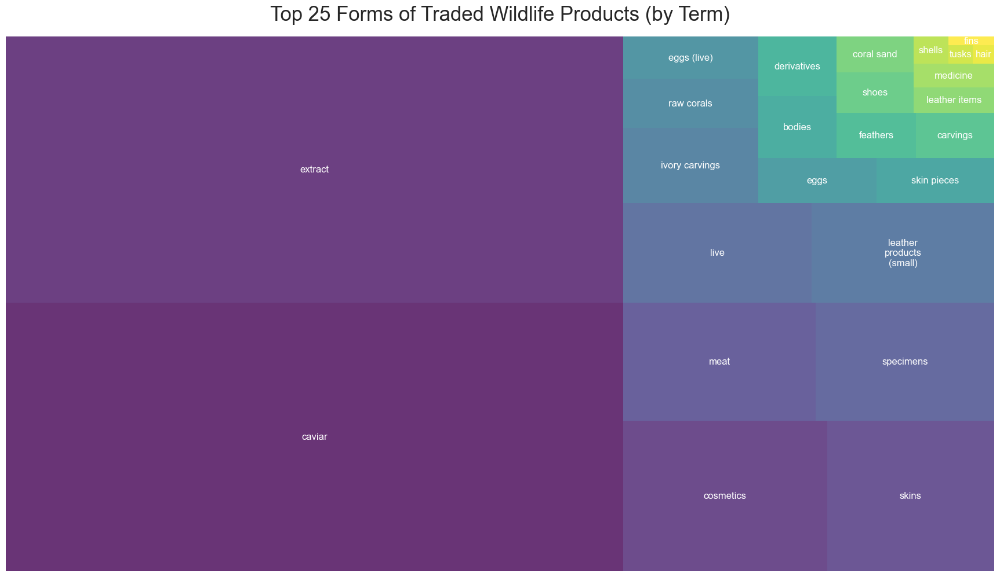

In [14]:
import squarify

term_volume = df_trade.groupby('Term')['Quantity'].sum().nlargest(25).reset_index()

plt.figure(figsize=(22, 12))
# Generate a dynamic color palette
colors = plt.cm.viridis(np.linspace(0, 1, len(term_volume)))

squarify.plot(
    sizes=term_volume['Quantity'],
    label=term_volume['Term'].str.wrap(15), # Wrap long labels to fit in the boxes
    alpha=0.8,
    color=colors,
    text_kwargs={'fontsize':12, 'color':'white'}
)

plt.title('Top 25 Forms of Traded Wildlife Products (by Term)', fontsize=25, pad=20)
plt.axis('off')
plt.show()

### **Top 20 Trade Routes**
A table of the top 20 most significant trade routes (Exporter-Importer pairs) by total volume.

In [15]:
print("Calculating Top 20 Trade Routes by Volume")

# Group by the route and sum the quantities
trade_routes = df_trade.groupby(['Exporter', 'Importer'], as_index=False)['Quantity'].sum()

# Find the 20 largest routes based on the 'Quantity'
top_routes = trade_routes.nlargest(20, 'Quantity')

# Display the result, resetting the index for cleaner presentation
print(top_routes.reset_index(drop=True))

Calculating Top 20 Trade Routes by Volume
   Exporter Importer      Quantity
0        FR       CH  3.708684e+09
1        CH       DE  9.208147e+08
2        IT       CH  5.411967e+08
3        KR       HK  5.053949e+08
4        CH       HK  4.989480e+08
5        DE       CH  3.410423e+08
6        CH       AT  2.885585e+08
7        IN       EG  2.400007e+08
8        CH       CN  2.181514e+08
9        CN       JP  1.459060e+08
10       CN       HK  1.321025e+08
11       CH       US  1.148957e+08
12       KR       CN  1.040294e+08
13       CN       US  8.644709e+07
14       FR       CN  8.493780e+07
15       IN       DZ  8.000001e+07
16       HK       US  7.396445e+07
17       AR       US  6.633169e+07
18       ID       US  6.443671e+07
19       FJ       US  4.338874e+07


In [18]:
import seaborn as sns
import networkx as nx
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

# Set plotting styles
plt.style.use('default')
sns.set_palette("husl")
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

### **Temporal Analysis Dashboard**
This dashboard explores how the wildlife trade has evolved over time, looking at total volume, number of transactions, and the trade purpose

In [19]:
def create_temporal_dashboard(df):
    """Create a dashboard showing temporal patterns in trade."""
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=(
            'Trade Volume Over Time', 'Number of Transactions Over Time', 
            'Top Taxa Trends by Volume', 'Trade Purpose Distribution Over Time (Stacked Bar)'
        )
    )
    
    # Trade volume over time
    yearly_volume = df.groupby('Year')['Quantity'].sum()
    fig.add_trace(go.Scatter(x=yearly_volume.index, y=yearly_volume.values, mode='lines+markers', name='Total Volume'), row=1, col=1)
    
    # Number of transactions over time
    yearly_count = df.groupby('Year').size()
    fig.add_trace(go.Scatter(x=yearly_count.index, y=yearly_count.values, mode='lines+markers', name='Transaction Count', marker_color='red'), row=1, col=2)
    
    # Top taxa trends
    top_taxa = df.groupby('Taxon')['Quantity'].sum().nlargest(5).index
    for taxon in top_taxa:
        taxon_data = df[df['Taxon'] == taxon].groupby('Year')['Quantity'].sum()
        fig.add_trace(go.Scatter(x=taxon_data.index, y=taxon_data.values, mode='lines', name=taxon), row=2, col=1)
    
    # Purpose distribution over time
    purpose_by_year = df.groupby(['Year', 'Purpose'])['Quantity'].sum().unstack(fill_value=0)
    for purpose in purpose_by_year.columns:
        fig.add_trace(go.Bar(x=purpose_by_year.index, y=purpose_by_year[purpose], name=purpose), row=2, col=2)
    
    fig.update_layout(height=800, title_text="Wildlife Trade Temporal Analysis Dashboard", barmode='stack')
    fig.update_xaxes(title_text="Year")
    fig.show()

print("Creating temporal analysis dashboard...")
create_temporal_dashboard(df_trade)

Creating temporal analysis dashboard...


### **Building the Global Trade Network**

A function to convert the tabular trade data into a directed graph using networkx. Nodes represent countries, and edges represent the aggregated trade volume between them.

In [20]:
def build_trade_network(df, min_trade_volume=50):
    #Build a directed trade network from CITES data.
    
    # Aggregate trade by country pairs
    trade_agg = df.groupby(['Exporter', 'Importer']).agg({
        'Quantity': 'sum',
        'Year': 'count' 
    }).reset_index()
    trade_agg.columns = ['Exporter', 'Importer', 'Total_Quantity', 'Trade_Count']
    
    # Filter for significant trade relationships
    trade_agg = trade_agg[trade_agg['Total_Quantity'] >= min_trade_volume]
    
    # Create a directed graph
    G_trade = nx.DiGraph()
    
    # Add nodes with country-level statistics as attributes
    all_countries = set(trade_agg['Exporter'].unique()) | set(trade_agg['Importer'].unique())
    for country in all_countries:
        exports = trade_agg[trade_agg['Exporter'] == country]['Total_Quantity'].sum()
        imports = trade_agg[trade_agg['Importer'] == country]['Total_Quantity'].sum()
        G_trade.add_node(country, 
                         exports=exports, 
                         imports=imports, 
                         total_trade=exports + imports)
    
    # Add edges with trade volume and count as attributes
    for _, row in trade_agg.iterrows():
        G_trade.add_edge(row['Exporter'], row['Importer'], 
                         weight=row['Total_Quantity'],
                         trade_count=row['Trade_Count'])
    
    return G_trade

# Build the network
print("Building the wildlife trade network...")
G_trade = build_trade_network(df_trade, min_trade_volume=100)
print(f"Network created: {G_trade.number_of_nodes()} nodes, {G_trade.number_of_edges()} edges")

# Calculate network metrics for visualization
in_strength = dict(G_trade.in_degree(weight='weight'))
out_strength = dict(G_trade.out_degree(weight='weight'))
total_strength = {node: in_strength.get(node, 0) + out_strength.get(node, 0) for node in G_trade.nodes()}

Building the wildlife trade network...
Network created: 256 nodes, 8197 edges


Creating main trade network visualization...


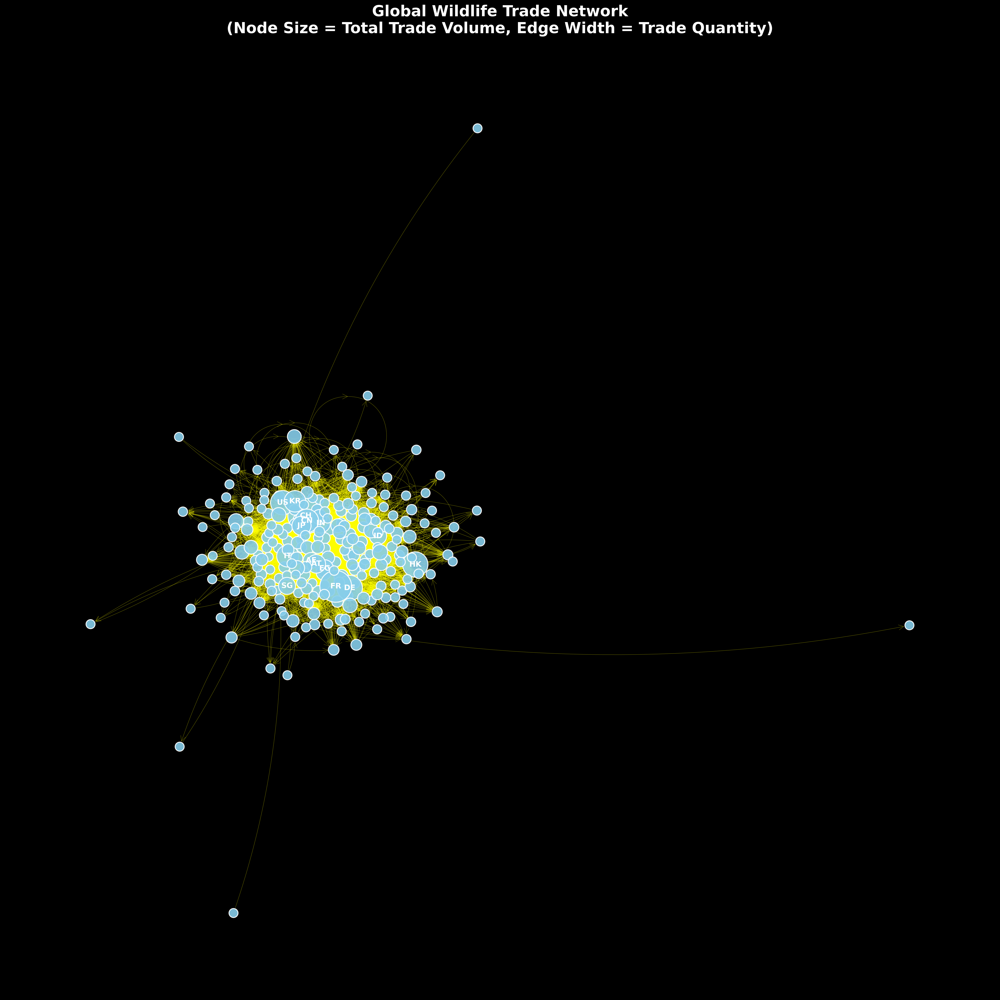

In [21]:
def plot_main_trade_network(G, figsize=(22, 22), layout_type='kamada_kawai'):
    """Create the main trade network visualization with proper rendering."""
    
    # Set dark style for this specific plot for better visual impact
    plt.style.use('dark_background')
    fig, ax = plt.subplots(figsize=figsize, facecolor='black')
    ax.set_facecolor('black')
    
    # Choose a layout algorithm for node positioning
    if layout_type == 'kamada_kawai':
        pos = nx.kamada_kawai_layout(G, scale=2)
    else:
        pos = nx.spring_layout(G, k=3, iterations=50, seed=42)
    
    # Calculate node sizes based on total trade strength
    max_strength = max(total_strength.values()) if total_strength else 1
    node_sizes = [np.sqrt(total_strength.get(node, 0) / max_strength) * 3000 + 200 for node in G.nodes()]
    
    # Calculate edge widths based on trade volume
    edge_weights = nx.get_edge_attributes(G, 'weight')
    max_weight = max(edge_weights.values()) if edge_weights else 1
    edge_widths = [np.log1p(edge_weights.get((u, v), 1) / max_weight) * 4 + 0.5 for u, v in G.edges()]
    
    # Draw network components
    nx.draw_networkx_edges(
        G, pos, ax=ax, width=edge_widths, alpha=0.4, edge_color='yellow',
        arrows=True, arrowstyle='->', arrowsize=20, connectionstyle="arc3,rad=0.1"
    )
    nx.draw_networkx_nodes(
        G, pos, ax=ax, node_size=node_sizes, node_color='skyblue',
        alpha=0.9, edgecolors='white', linewidths=1.5
    )
    
    # Add labels only for the most important nodes to avoid clutter
    important_nodes = {node: node for node, strength in sorted(total_strength.items(), key=lambda x: x[1], reverse=True)[:15]}
    nx.draw_networkx_labels(
        G, pos, ax=ax, labels=important_nodes, font_size=12, font_color='white', font_weight='bold'
    )
    
    # Add title and formatting
    ax.set_title('Global Wildlife Trade Network\n(Node Size = Total Trade Volume, Edge Width = Trade Quantity)', 
                 fontsize=24, color='white', fontweight='bold', pad=20)
    ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Reset style to default for subsequent plots
    plt.style.use('default')

print("Creating main trade network visualization...")
plot_main_trade_network(G_trade)

In [22]:
def create_interactive_trade_network(G):
    """Create an interactive Plotly network visualization."""
    pos = nx.spring_layout(G, k=2, iterations=50, seed=42)

    # Build the edge traces
    edge_x, edge_y = [], []
    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])

    edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines')

    # Build node traces
    node_x, node_y, node_text, node_info, node_sizes, node_colors = [], [], [], [], [], []
    for node in G.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        
        exports = G.nodes[node].get('exports', 0)
        imports = G.nodes[node].get('imports', 0)
        total_trade = G.nodes[node].get('total_trade', 0)
        
        node_text.append(node)
        node_info.append(f"<b>{node}</b><br>Total Exports: {exports:,.0f}<br>Total Imports: {imports:,.0f}<br>Total Trade: {total_trade:,.0f}")
        node_sizes.append(np.sqrt(total_trade))
        node_colors.append(total_trade)

        # Create node trace
        node_trace = go.Scatter(
            x=node_x, y=node_y, mode='markers', hoverinfo='text', text=node_info,
            marker=dict(
                showscale=True,
                colorscale='Viridis',
                reversescale=True,
                color=node_colors,
                size=[s / max(node_sizes) * 50 + 10 if max(node_sizes) > 0 else 10 for s in node_sizes],
                colorbar=dict(
                    thickness=15,
                    title=dict(text='Total Trade Volume', side='right'),
                    xanchor='left'
                ),
                line=dict(width=2)
            )
        )


    # Combine edge and node traces into a single Plotly figure
    fig = go.Figure(
        data=[edge_trace, node_trace],
        layout=go.Layout(
            title=dict(
                text='Interactive Global Wildlife Trade Network',
                font=dict(size=16)
            ),
            showlegend=False,
            hovermode='closest',
            margin=dict(b=20, l=5, r=5, t=40),
            xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
            yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
            height=700
        )
    )

    fig.show()

print("Creating interactive network visualization...")
create_interactive_trade_network(G_trade)

Creating interactive network visualization...


Creating a simplified network view with the top 75 trade routes


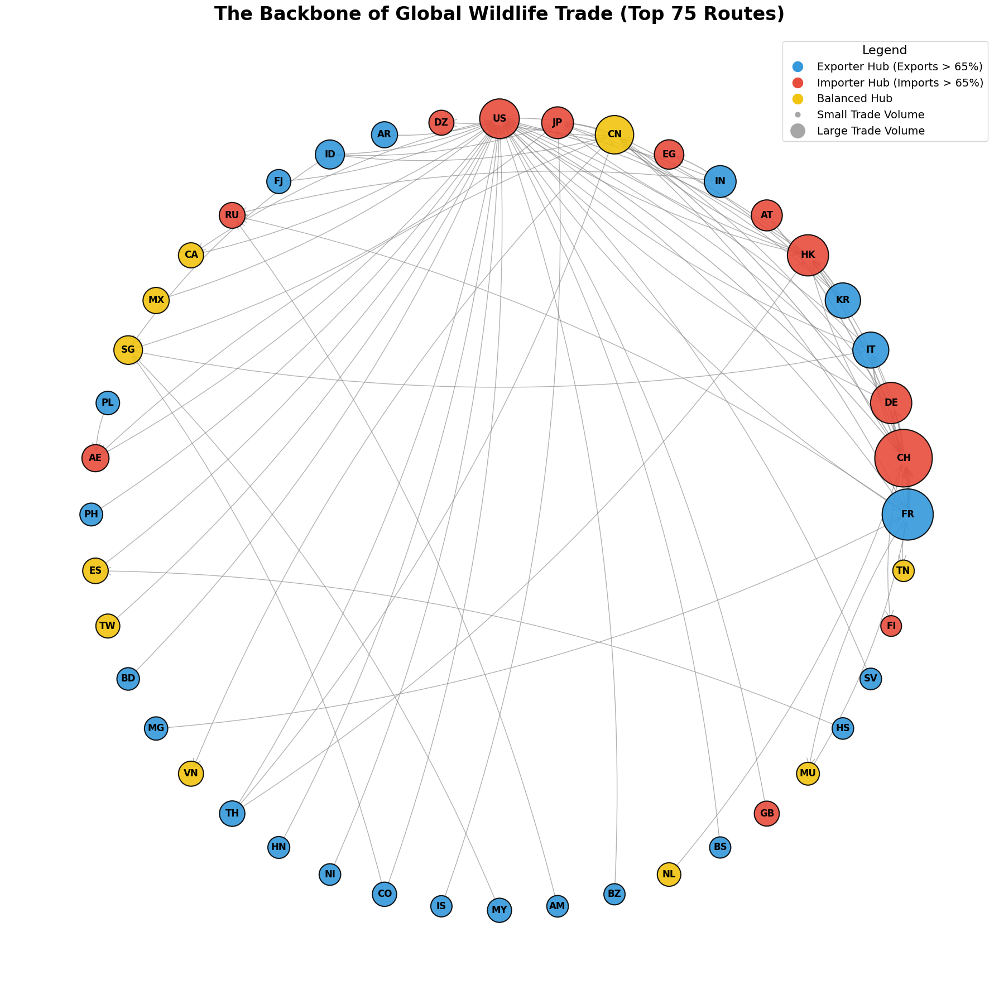

In [23]:
# Simplified Network Visualization

def plot_simplified_trade_network(G, top_n_edges=75, figsize=(18, 18)):
    
    # Creates a simplified and visually interpretable trade network visualization.
     
    print(f"Creating a simplified network view with the top {top_n_edges} trade routes")
    
    # Filter the graph to create a simpler "backbone" view 
    if G.number_of_edges() == 0:
        print("Warning: The graph has no edges. Cannot create visualization.")
        return

    # Sort edges by weight and get the top N
    top_edges = sorted(G.edges(data=True), key=lambda t: t[2].get('weight', 0), reverse=True)[:top_n_edges]
    
    # Create a new graph containing only the top edges and their nodes
    H = nx.DiGraph()
    for u, v, data in top_edges:
        H.add_node(u, **G.nodes[u])
        H.add_node(v, **G.nodes[v])
        H.add_edge(u, v, **data)

    if H.number_of_nodes() == 0:
        print("Warning: The filtered graph has no nodes. Cannot create visualization.")
        return
        
    # Define Visual Properties for the new graph H
    pos = nx.circular_layout(H)
    
    # Calculate node sizes based on total trade (from original graph attributes)
    total_strength = {node: H.nodes[node].get('total_trade', 0) for node in H.nodes()}
    max_strength = max(total_strength.values()) if total_strength else 1
    node_sizes = [np.sqrt(s / max_strength) * 5000 + 500 for s in total_strength.values()]
    
    # Determine node colors based on trade role (Exporter vs. Importer)
    node_colors = []
    color_map = {'Exporter Hub': '#3498db', 'Importer Hub': '#e74c3c', 'Balanced Hub': '#f1c40f'}
    for node in H.nodes():
        exports = H.nodes[node].get('exports', 0)
        imports = H.nodes[node].get('imports', 0)
        total_trade = exports + imports
        if total_trade > 0 and exports / total_trade > 0.65:
            node_colors.append(color_map['Exporter Hub'])
        elif total_trade > 0 and imports / total_trade > 0.65:
            node_colors.append(color_map['Importer Hub'])
        else:
            node_colors.append(color_map['Balanced Hub'])

    # Calculate edge widths based on trade volume
    edge_weights = nx.get_edge_attributes(H, 'weight')
    max_weight = max(edge_weights.values()) if edge_weights else 1
    edge_widths = [np.log1p(w / max_weight) * 5 + 1 for w in edge_weights.values()]
    
    # Plot the simplified network
    plt.style.use('default')
    fig, ax = plt.subplots(figsize=figsize)
    
    nx.draw_networkx_edges(
        H, pos, ax=ax,
        width=edge_widths,
        alpha=0.6,
        edge_color='grey',
        arrows=True,
        arrowstyle='->',
        arrowsize=25,
        connectionstyle="arc3,rad=0.1"
    )
    
    nx.draw_networkx_nodes(
        H, pos, ax=ax,
        node_size=node_sizes,
        node_color=node_colors,
        alpha=0.9,
        edgecolors='black',
        linewidths=1.5
    )
    
    nx.draw_networkx_labels(
        H, pos, ax=ax,
        font_size=12,
        font_color='black',
        font_weight='bold'
    )
    
    # Add Title and Legend
    ax.set_title(f'The Backbone of Global Wildlife Trade (Top {top_n_edges} Routes)', fontsize=24, fontweight='bold', pad=20)
    ax.axis('off')
    
    # Create custom legend handles
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', label='Exporter Hub (Exports > 65%)', markerfacecolor=color_map['Exporter Hub'], markersize=15),
        Line2D([0], [0], marker='o', color='w', label='Importer Hub (Imports > 65%)', markerfacecolor=color_map['Importer Hub'], markersize=15),
        Line2D([0], [0], marker='o', color='w', label='Balanced Hub', markerfacecolor=color_map['Balanced Hub'], markersize=15),
        Line2D([0], [0], marker='o', color='w', label='Small Trade Volume', markerfacecolor='grey', markersize=8, alpha=0.7),
        Line2D([0], [0], marker='o', color='w', label='Large Trade Volume', markerfacecolor='grey', markersize=20, alpha=0.7)
    ]
    ax.legend(handles=legend_elements, loc='upper right', fontsize=14, title='Legend', title_fontsize=16)
    
    plt.tight_layout()
    plt.show()

# Call the new visualization function
plot_simplified_trade_network(G_trade, top_n_edges=75)

### **Detailed Network Metrics and Centrality Analysis**
This moves beyond visualization to quantitatively analyze the network structure. It identifies the most important countries based on different centrality measures (degree, betweenness), which helps pinpoint key players and intermediaries in the trade network.

Analyzing network properties and centrality...
NETWORK ANALYSIS REPORT: 
Nodes (Countries): 256, Edges (Trade Routes): 8197
Network Density: 0.1256

 TOP 5 COUNTRIES BY CENTRALITY
By Degree (Most Connected):
  - US: 1.616
  - CH: 1.302
  - DE: 1.278
  - FR: 1.275
  - IT: 1.235

By Betweenness (Key Intermediaries/Bridges):
  - US: 0.215
  - CH: 0.070
  - FR: 0.068
  - IT: 0.052
  - GB: 0.052

TOP 5 TRADE VOLUME LEADERS
Top Exporters:
  - FR: 3,914,996,706
  - CH: 2,162,859,680
  - KR: 636,942,749
  - IT: 634,874,261
  - CN: 473,474,833

Top Importers:
  - CH: 4,710,146,644
  - HK: 1,322,838,728
  - US: 1,061,691,107
  - DE: 1,018,140,909
  - CN: 573,826,448


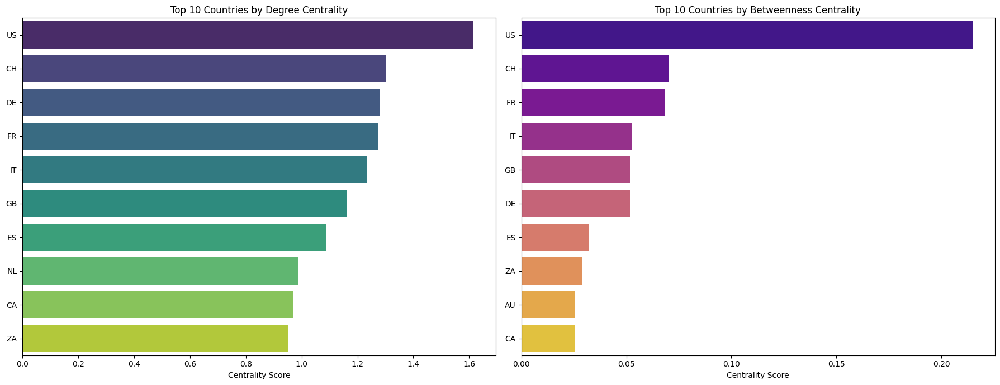

In [24]:
def analyze_network_properties(G):
    """Perform a comprehensive network analysis and visualize key metrics."""
    print("NETWORK ANALYSIS REPORT: ")
    print(f"Nodes (Countries): {G.number_of_nodes()}, Edges (Trade Routes): {G.number_of_edges()}")
    print(f"Network Density: {nx.density(G):.4f}\n")
    
    # Centrality measures
    degree_cent = nx.degree_centrality(G)
    betweenness_cent = nx.betweenness_centrality(G)
    
    # Top countries by centrality
    print(" TOP 5 COUNTRIES BY CENTRALITY")
    print("By Degree (Most Connected):")
    for country, cent in sorted(degree_cent.items(), key=lambda x: x[1], reverse=True)[:5]:
        print(f"  - {country}: {cent:.3f}")
    
    print("\nBy Betweenness (Key Intermediaries/Bridges):")
    for country, cent in sorted(betweenness_cent.items(), key=lambda x: x[1], reverse=True)[:5]:
        print(f"  - {country}: {cent:.3f}")
    
    # Trade volume leaders
    print("\n" + "TOP 5 TRADE VOLUME LEADERS")
    print("Top Exporters:")
    for country, volume in sorted(out_strength.items(), key=lambda x: x[1], reverse=True)[:5]:
        print(f"  - {country}: {volume:,.0f}")
    
    print("\nTop Importers:")
    for country, volume in sorted(in_strength.items(), key=lambda x: x[1], reverse=True)[:5]:
        print(f"  - {country}: {volume:,.0f}")
    
    # Visualization of Centrality Measures
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    
    # Top 10 Degree Centrality
    top_10_degree = sorted(degree_cent.items(), key=lambda x: x[1], reverse=True)[:10]
    sns.barplot(x=[val for _, val in top_10_degree], y=[key for key, _ in top_10_degree], ax=axes[0], palette='viridis')
    axes[0].set_title('Top 10 Countries by Degree Centrality')
    axes[0].set_xlabel('Centrality Score')
    
    # Top 10 Betweenness Centrality
    top_10_betweenness = sorted(betweenness_cent.items(), key=lambda x: x[1], reverse=True)[:10]
    sns.barplot(x=[val for _, val in top_10_betweenness], y=[key for key, _ in top_10_betweenness], ax=axes[1], palette='plasma')
    axes[1].set_title('Top 10 Countries by Betweenness Centrality')
    axes[1].set_xlabel('Centrality Score')
    
    plt.tight_layout()
    plt.show()

print("Analyzing network properties and centrality...")
analyze_network_properties(G_trade)

### **Preliminary Risk Assessment Dashboard**
This dashboard visualizes different facets of potential risk. It identifies high-volume trade routes, high-risk species (based on trade volume), and key intermediary countries (based on betweenness centrality) that could act as bridges for pathogen transmission.

In [25]:
def create_risk_assessment_dashboard(df, G):
    """Create a dashboard for a preliminary trade risk assessment."""
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=(
            'Top 15 High-Volume Trade Routes',
            'Top 15 Traded Taxa (Proxy for Species Risk)',
            'Top 15 Geographic Hotspots (Exporters)',
            'Top 15 Network Vulnerabilities (Intermediaries)'
        ),
        specs=[[{"type": "bar"}, {"type": "bar"}],
               [{"type": "bar"}, {"type": "bar"}]]
    )

    # High-volume trade routes
    trade_routes = df.groupby(['Exporter', 'Importer'])['Quantity'].sum().nlargest(15).sort_values()
    route_labels = [f"{imp} ← {exp}" for exp, imp in trade_routes.index]
    fig.add_trace(go.Bar(y=route_labels, x=trade_routes.values, orientation='h', marker_color='red'), row=1, col=1)

    # Species risk (by volume)
    species_risk = df.groupby('Taxon')['Quantity'].sum().nlargest(15).sort_values(ascending=False)
    fig.add_trace(go.Bar(x=species_risk.index, y=species_risk.values, marker_color='orange'), row=1, col=2)

    # Geographic risk hotspots (exporters)
    exporter_risk = df.groupby('Exporter')['Quantity'].sum().nlargest(15).sort_values(ascending=False)
    fig.add_trace(go.Bar(x=exporter_risk.index, y=exporter_risk.values, marker_color='darkred'), row=2, col=1)

    # Network vulnerability (betweenness centrality)
    betweenness = nx.betweenness_centrality(G)
    top_betweenness = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:15]
    vuln_names = [c[0] for c in top_betweenness]
    vuln_scores = [c[1] for c in top_betweenness]
    fig.add_trace(go.Bar(x=vuln_names, y=vuln_scores, marker_color='purple'), row=2, col=2)

    fig.update_layout(height=900, title_text="Preliminary Wildlife Trade Risk Assessment Dashboard", showlegend=False)
    fig.update_xaxes(tickangle=45)
    fig.show()

print("Creating risk assessment dashboard")
create_risk_assessment_dashboard(df_trade, G_trade)

Creating risk assessment dashboard


In [26]:
def export_analysis_results(df, G, save_directory="cites_analysis_output"):
    """Export all analysis results and the network graph."""
    if not os.path.exists(save_directory):
        os.makedirs(save_directory)
    
    print(f"Exporting analysis results to '{save_directory}'")
    
    # Export processed data
    processed_data_path = os.path.join(save_directory, "processed_cites_trade_data.csv")
    df.to_csv(processed_data_path, index=False)
    print(f" Processed data saved to {processed_data_path}")
    
    # Export network data in GEXF format
    network_path = os.path.join(save_directory, "wildlife_trade_network.gexf")
    nx.write_gexf(G, network_path)
    print(f" Network graph saved to {network_path}")
    
    # Export network metrics
    metrics_df = pd.DataFrame({
        'degree_centrality': pd.Series(nx.degree_centrality(G)),
        'betweenness_centrality': pd.Series(nx.betweenness_centrality(G)),
        'in_strength': pd.Series(in_strength),
        'out_strength': pd.Series(out_strength),
        'total_strength': pd.Series(total_strength)
    }).reset_index().rename(columns={'index': 'Country'})
    metrics_path = os.path.join(save_directory, "network_metrics.csv")
    metrics_df.to_csv(metrics_path, index=False)
    print(f" Network metrics saved to {metrics_path}")
    
    print("\nExport complete")

# Export all results
export_analysis_results(df_trade, G_trade)

Exporting analysis results to 'cites_analysis_output'
 Processed data saved to cites_analysis_output\processed_cites_trade_data.csv
 Network graph saved to cites_analysis_output\wildlife_trade_network.gexf
 Network metrics saved to cites_analysis_output\network_metrics.csv

Export complete


### **Building the target variable**

In [27]:
# Import the High-Risk Species List from the week1a.ipynb (ncbi analysis notebook)

import json

# Define the filename where the list is stored
input_list_filename = "high_risk_species_list.json"

try:
    with open(input_list_filename, 'r') as f:
        # Use json.load to read the JSON file back into a Python list
        high_risk_species_list = json.load(f)

    # For efficient searching, convert the list to a set
    high_risk_species_set = set(high_risk_species_list)

    print(f" Successfully imported a list of {len(high_risk_species_set)} high-risk species from:")
    print(f"   '{input_list_filename}'")
    print("\n First 10 Species from the Imported List")
    print(high_risk_species_list[:10])

except FileNotFoundError:
    print(f"ERROR: The file '{input_list_filename}' was not found.")
    print("Please make sure you have run the NCBI analysis notebook first to generate this file,")
    print("and that the file is in the same directory as this notebook.")

 Successfully imported a list of 909 high-risk species from:
   'high_risk_species_list.json'

 First 10 Species from the Imported List
['Equus Caballus', 'Bos Taurus', 'Sus Scrofa', 'Mus Musculus', 'Canis Lupus', 'Gallus Gallus', 'Capra Hircus', 'Camelus Dromedarius', 'Rattus Norvegicus', 'Macaca Mulatta']


In [28]:
# Create Genus Sets for Flexible Matching

# Create a set of high-risk GENERA
high_risk_genus_set = {species.split()[0] for species in high_risk_species_list}
print(f"Created a set of {len(high_risk_genus_set)} unique high-risk genera.")
print(f" Example genera: {list(high_risk_genus_set)[:5]}")


high_risk_species_set = set(high_risk_species_list)

# Create a 'Genus' column in the CITES DataFrame 
df_trade['trade_genus'] = df_trade['Taxon'].apply(lambda x: str(x).split()[0])

print("\nAdded a 'trade_genus' column to the CITES DataFrame.")
print(" Example of the new column")
display(df_trade[['Taxon', 'trade_genus']].head())

Created a set of 511 unique high-risk genera.
Example genera: ['Gymnogyps', 'Aegithalos', 'Chrotogale', 'Sekeetamys', 'Serinus']

Added a 'trade_genus' column to the CITES DataFrame.
 Example of the new column


,Taxon,trade_genus
0,Ailurus fulgens,Ailurus
1,Aldabrachelys gigantea,Aldabrachelys
2,Alligator mississippiensis,Alligator
3,Anodorhynchus leari,Anodorhynchus
4,Balaenidae spp.,Balaenidae


In [1]:
# Find High-Risk Trades (Fast & Memory-Efficient)

print("Finding high-risk trades")

# Create Boolean Masks with Vectorized `isin()` 
direct_match_mask = df_trade['Taxon'].isin(high_risk_species_set)
genus_match_mask = df_trade['trade_genus'].isin(high_risk_genus_set)

# Combine the Masks
combined_high_risk_mask = direct_match_mask | genus_match_mask

# Filter the DataFrame using the Combined Mask
risky_trades_df = df_trade[combined_high_risk_mask].copy()

# Report the Results
matched_taxa = risky_trades_df['Taxon'].unique()

print(f"Found {len(risky_trades_df):,} trade records for {len(matched_taxa)} unique high-risk taxa.")
print("Example matched taxa found in CITES data:")
print(list(matched_taxa)[:15])


Finding high-risk trades


NameError: name 'df_trade' is not defined